DCGANS
Imports

In [445]:
import os
import random
import torch as torch
import torch.nn as nn
import torch.nn.parallel
import torch.optim as optim
import torch.utils.data as utils
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from PIL import Image

In [446]:
# Set random seed for reproducibility
manualSeed = 999
#manualSeed = random.randint(1, 10000) # use if you want new results
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)
torch.use_deterministic_algorithms(True) # Needed for reproducible results

Random Seed:  999


HyperParameters
200 Epochs -> between 200 and 250 reccomended for my model version. Anything less than 175 will lose quality, going above 250 might cause Collapse.

In [447]:
# Number of workers for dataloader
workers = 0

# Batch size during training
batch_size = 128

# Spatial size of training images. All images will be resized to this
#   size using a transformer.
image_size = 64

# Number of channels in the training images. For color images this is 3
nc = 3

# Size of z latent vector (i.e. size of generator input)
nz = 100

# Size of feature maps in generator
ngf = 64

# Size of feature maps in discriminator
ndf = 64

# Number of training epochs
num_epochs = 200

# Learning rate for generator optimizers
glr = 0.0002

# Learning rate for discriminator optimizers
dlr = 0.0002

# Beta1 hyperparameter for Adam optimizers
beta1 = 0.5

# Number of GPUs available. Use 0 for CPU mode.
ngpu = 1

# Decide which device we want to run on
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

Simple Class to retrieve images

In [448]:


class SimpleImageFolder(utils.Dataset):
    def __init__(self, root, transform=None):
        # save the folder root and the transform for later use
        self.root = root
        self.transform = transform

        # build a list of absolute file paths for images in the folder
        self.files = [
            os.path.join(root, f)                                 # full path: root + filename
            for f in os.listdir(root)                             # list every entry in the root folder
            if f.lower().endswith((".png", ".jpg", ".jpeg"))      # keep only files with these extensions
        ]

    def __len__(self):
        # return how many images we found — DataLoader uses this
        return len(self.files)

    def __getitem__(self, idx):
        # Get the full file path of the requested index
        img_path = self.files[idx]

        # Open the image and convert to RGB (3 channels)
        img = Image.open(img_path).convert("RGB")

        # Apply transforms (ToTensor, Normalize, etc.) if provided
        if self.transform:
            img = self.transform(img)

        # Return the processed image (usually a tensor)
        return img,0

Transforms As you can observe, has two Data Augmentation Transformations, Flip and Jitter

In [449]:
#datapath
datapath =  r"C:\Users\user\Downloads\cats"

transform = transforms.Compose([
    transforms.Resize(64),
    transforms.CenterCrop(64),

      # --- Light DA ---
    transforms.RandomHorizontalFlip(p=0.5),  
    transforms.ColorJitter(
        brightness=0.15,
        contrast=0.15,
        saturation=0.15
    ),

    
    transforms.RandomApply([
        transforms.GaussianBlur(kernel_size=3, sigma=(0.1, 1.0))
    ], p=0.2),

    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5),
                         (0.5, 0.5, 0.5))
])

dataset = SimpleImageFolder(datapath,transform=transform)

dataloader = utils.DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=workers)

Just for observation

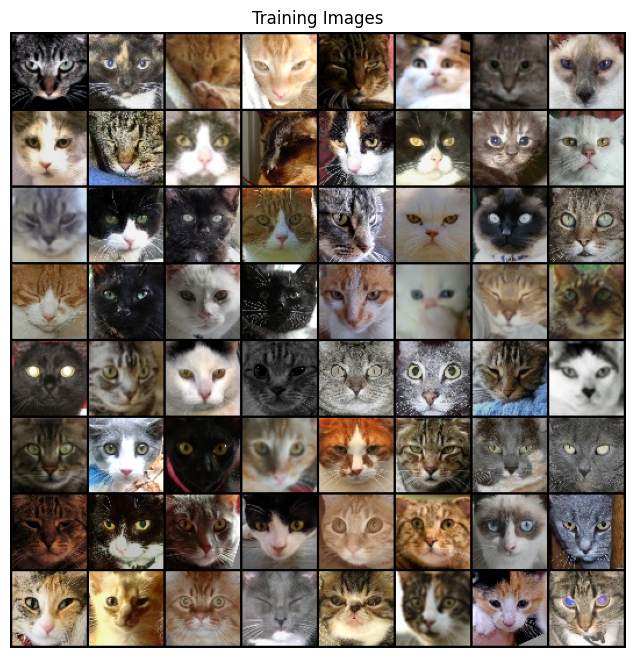

In [450]:
# Plot some training images
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))
plt.show()

Weights Initialization by Book (Same as Proffesor and as reccommended)

In [451]:
# custom weights initialization called on ``netG`` and ``netD``
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

Generator by Book (Same as Proffesor and as reccommended)

In [452]:
# Generator Code
#nz=100
#ngf=64
#nc=3
class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d( nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. ``(ngf*8) x 4 x 4``
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. ``(ngf*4) x 8 x 8``
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. ``(ngf*2) x 16 x 16``
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. ``(ngf) x 32 x 32``
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. ``(nc) x 64 x 64``
        )

    def forward(self, input):
        return self.main(input)

In [453]:
# Create the generator
netG = Generator(ngpu).to(device)

# Handle multi-GPU if desired
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

# Apply the ``weights_init`` function to randomly initialize all weights
#  to ``mean=0``, ``stdev=0.02``.
netG.apply(weights_init)

# Print the model
print(netG)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


Discriminator By Book , I added a dropout variable to stabilize training and improve performance

In [454]:
#Discriminator Code
#nc=3
#ndf = 64

class Discriminator(nn.Module):
    def __init__(self, ngpu, dropout_p=0.0):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.dropout_p = dropout_p
        self.main = nn.Sequential(
            # input is ``(nc) x 64 x 64``
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf) x 32 x 32``
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*2) x 16 x 16``
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*4) x 8 x 8``
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout(dropout_p),
            # state size. ``(ndf*8) x 4 x 4``
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def set_dropout(self, step):
        self.dropout_p = self.dropout_p + step
        # update all dropout layers
        for m in self.modules():
            if isinstance(m, nn.Dropout):
                m.p = self.dropout_p

    def forward(self, input):
        return self.main(input)

In [455]:
# Create the Discriminator
netD = Discriminator(ngpu).to(device)

# Handle multi-GPU if desired
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))

# Apply the ``weights_init`` function to randomly initialize all weights
# like this: ``to mean=0, stdev=0.2``.
netD.apply(weights_init)

# Print the model
print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Dropout(p=0.0, inplace=False)
    (12): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (13): Sigmoi

My Version of DCGANS has triggers. 
If the Discriminator starts overpowering the Generator and the Generator's loss starts spyraling up, a trigger will apply techniques to slow down the discriminator and accelerate the Generator's training.

The generator increases its learning rate by + 0.000027 per trigger
The discriminator decreases its learning rate by - 0.00002 per trigger
Label Smoothing on real_labels is increase by 0.02 per trigger
Dropout on the discriminator is increased by 0.07 per trigger
Theres a max of 7 triggers

Initial Parameters
Learning rate discriminator = 0.0002
Learning rate Generator = 0.0002
Dropout = 0
Real Label = 1

After 7 Triggers
Learning rate discriminator = 0.00006
Learning rate Generator = 0.000389
Dropout = 0.49
Real Label = 0.86


In [456]:
# Initialize the ``BCELoss`` function
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

# Establish convention for real and fake labels during training
real_label = 1.
fake_label = 0.
real_label_smoothing = real_label

#Define the Step triggers adn trigger variables to stabalize training
cooldown_epochs = 8
last_trigger_epoch = 0
triggers_done = 0
lr_D_step = 2e-5
lr_G_step = 27e-6
D_loss_min_acceptable = 1.1
G_loss_max_acceptable = 1.6
max_triggers=7
dropout_step = 0.07
D_bad_counter = 0
bad_required = 5
label_smoothing_step = 0.02


# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=dlr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=glr, betas=(beta1, 0.999))

In [457]:
# Training Loop

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):
  # For each batch in the dataloader
  epoch_D_loss = 0.0
  epoch_G_loss = 0.0

  for i, data in enumerate(dataloader, 0):
    ############################
    # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
    ###########################
    ## Train with all-real batch
    netD.zero_grad()
    # Format batch
    real_cpu = data[0].to(device)
    b_size = real_cpu.size(0)
    label = torch.full((b_size,), real_label_smoothing, dtype=torch.float, device=device)
    # Forward pass real batch through D
    output = netD(real_cpu).view(-1)
    # Calculate loss on all-real batch
    errD_real = criterion(output, label)
    # Calculate gradients for D in backward pass
    errD_real.backward()
    D_x = output.mean().item()

    ## Train with all-fake batch
    # Generate batch of latent vectors
    noise = torch.randn(b_size, nz, 1, 1, device=device)
    # Generate fake image batch with G
    fake = netG(noise)
    label.fill_(fake_label)
    # Classify all fake batch with D
    output = netD(fake.detach()).view(-1)
    # Calculate D's loss on the all-fake batch
    errD_fake = criterion(output, label)
    # Calculate the gradients for this batch, accumulated (summed) with previous gradients
    errD_fake.backward()
    D_G_z1 = output.mean().item()
    # Compute error of D as sum over the fake and the real batches
    errD = errD_real + errD_fake
    # Update D
    optimizerD.step()

    ############################
    # (2) Update G network: maximize log(D(G(z)))
    ###########################
    netG.zero_grad()
    label.fill_(real_label_smoothing)  # fake labels are real for generator cost
    # Since we just updated D, perform another forward pass of all-fake batch through D
    output = netD(fake).view(-1)
    # Calculate G's loss based on this output
    errG = criterion(output, label)
    # Calculate gradients for G
    errG.backward()
    D_G_z2 = output.mean().item()
    # Update G
    optimizerG.step()


    '''g_steps = 2
    for _ in range(g_steps):
        netG.zero_grad()
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        fake = netG(noise)
        output = netD(fake).view(-1)
        label = torch.full((b_size,), real_label, device=device)
        errG = criterion(output, label)
        errG.backward()
        optimizerG.step()

    D_G_z2 = output.mean().item()'''
    # Save Losses for plotting later
    G_losses.append(errG.item())
    D_losses.append(errD.item())

    # Save for epoch averaging
    epoch_D_loss += errD.item()
    epoch_G_loss += errG.item()

    iters += 1

  ############################
  # Print once PER EPOCH
  ############################
  epoch_D_loss_avg=epoch_D_loss/len(dataloader)
  epoch_G_loss_avg=epoch_G_loss/len(dataloader)
  print(f"Epoch [{epoch+1}/{num_epochs}] "
        f"Loss_D: {epoch_D_loss_avg:.4f} "
        f"Loss_G: {epoch_G_loss_avg:.4f} "
        f"D(x): {D_x:.4f} D(G(z)): {D_G_z1:.4f}/{D_G_z2:.4f}")

  ############################
  # Save images every 25 epochs
  ############################
  if (epoch + 1) % 25 == 0 or epoch == num_epochs - 1:
    with torch.no_grad():
      fake = netG(fixed_noise).detach().cpu()
    grid = vutils.make_grid(fake, padding=2, normalize=True)
    img_list.append(grid)


  ############################
  # Apply Changes
  ############################


  # ===== Check if this epoch is "bad" =====
  bad_epoch = (
      epoch > 5
      and epoch_D_loss_avg < D_loss_min_acceptable
      and epoch_G_loss_avg > G_loss_max_acceptable
  )

  if bad_epoch:
      D_bad_counter += 1
  else:
      D_bad_counter = 0   # reset if one good epoch appears


  # ===== Only trigger stabilization if N bad epochs in a row =====
  if (D_bad_counter >= bad_required
      and triggers_done < max_triggers
      and (epoch - last_trigger_epoch) >= cooldown_epochs):

    triggers_done += 1
    last_trigger_epoch = epoch
    D_bad_counter = 0   # reset streak after triggering

    print(f"Step number {triggers_done} TRIGGERED after 5 bad epochs")

    # Apply label smoothing change
    real_label_smoothing -= label_smoothing_step
    
    # Apply LR change
    dlr -= lr_D_step
    for pg in optimizerD.param_groups:
        pg['lr'] = dlr

    glr += lr_G_step
    for pg in optimizerG.param_groups:
        pg['lr'] = glr

    # Apply dropout change
    if isinstance(netD, nn.DataParallel):
        netD.module.set_dropout(dropout_step)
    else:
        netD.set_dropout(dropout_step)

      

Starting Training Loop...
Epoch [1/200] Loss_D: 0.5967 Loss_G: 8.7494 D(x): 0.6619 D(G(z)): 0.0566/0.0089
Epoch [2/200] Loss_D: 0.5957 Loss_G: 5.7358 D(x): 0.8862 D(G(z)): 0.0160/0.0054
Epoch [3/200] Loss_D: 0.6544 Loss_G: 4.8145 D(x): 0.1987 D(G(z)): 0.1603/0.0873
Epoch [4/200] Loss_D: 0.7262 Loss_G: 4.7919 D(x): 0.7303 D(G(z)): 0.4543/0.0000
Epoch [5/200] Loss_D: 0.6830 Loss_G: 5.4113 D(x): 0.9889 D(G(z)): 0.0885/0.0001
Epoch [6/200] Loss_D: 0.6732 Loss_G: 5.4033 D(x): 0.9265 D(G(z)): 0.4682/0.0000
Epoch [7/200] Loss_D: 0.7191 Loss_G: 5.3566 D(x): 0.8377 D(G(z)): 0.0811/0.0640
Epoch [8/200] Loss_D: 0.7447 Loss_G: 5.1929 D(x): 0.7770 D(G(z)): 0.3305/0.0646
Epoch [9/200] Loss_D: 0.6914 Loss_G: 5.0851 D(x): 0.9744 D(G(z)): 0.3844/0.0000
Epoch [10/200] Loss_D: 0.6377 Loss_G: 5.0373 D(x): 0.9793 D(G(z)): 0.2076/0.0061
Epoch [11/200] Loss_D: 0.6911 Loss_G: 4.9481 D(x): 0.2965 D(G(z)): 0.3516/0.0025
Step number 1 TRIGGERED after 5 bad epochs
Epoch [12/200] Loss_D: 0.8796 Loss_G: 4.3609 D(x)

Graph the Loss per epoch

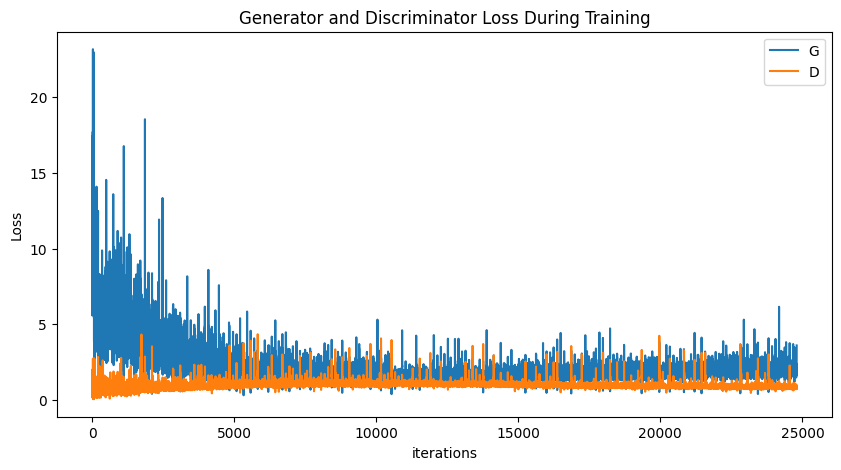

In [458]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

Show Changes across time per 25 epochs

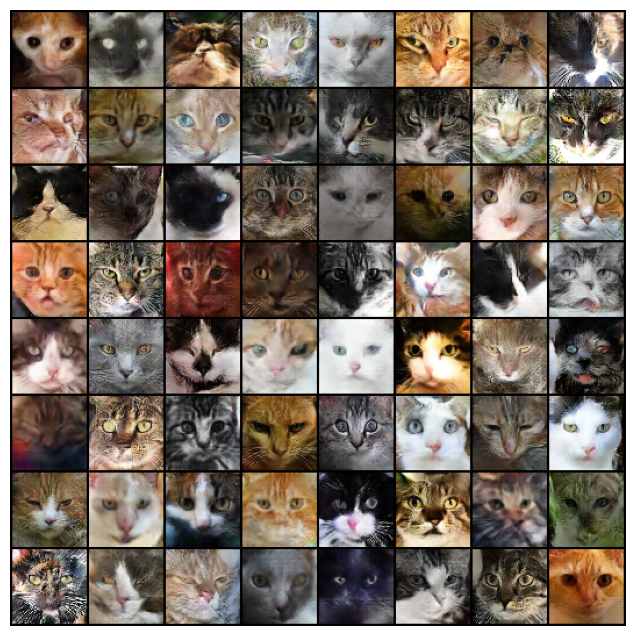

In [459]:
from IPython.display import HTML

fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

Compare Real vs Fake

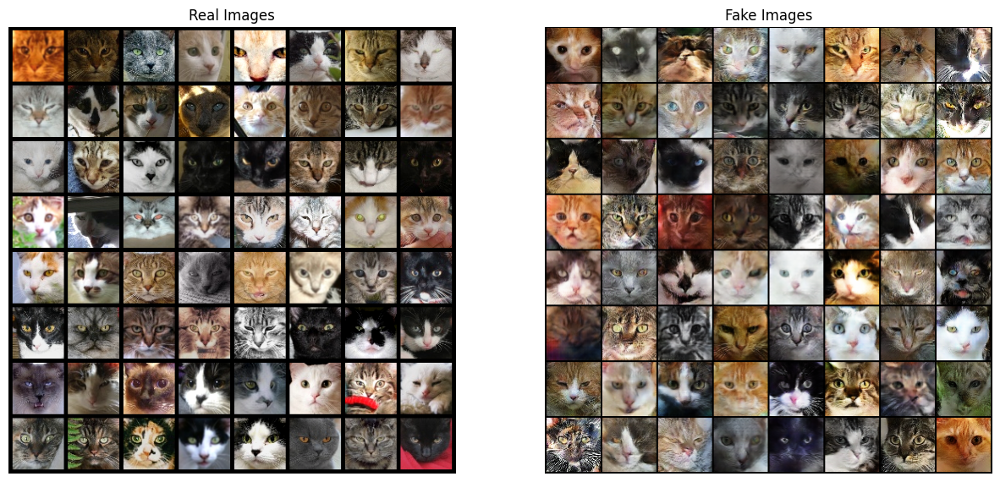

In [460]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(dataloader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()